In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import matplotlib.dates as mdates
from pyproj import Transformer
pd.set_option('display.max_columns', None)  

# Read in crime data and convert x/y to appropriate projection

In [2]:
crime = pd.read_csv('data/crime/crime.csv', low_memory=False)
crime.head()

,IncidentNum,ReportedDateTime,ReportedYear,ReportedMonth,Location,WeaponUsed,ALD,NSP,POLICE,TRACT,WARD,ZIP,RoughX,RoughY,Arson,AssaultOffense,Burglary,CriminalDamage,Homicide,LockedVehicle,Robbery,SexOffense,Theft,VehicleTheft,Total,Violent,Property
0,163020125,2016-10-28 19:55:00,2016,10,S 10TH ST / W GRANT ST,ROCK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,1,0,0,0,0,0,0,2.0,0,2.0
1,163020126,2016-10-28 19:03:00,2016,10,7822 W CAPITOL DR,UNKNO,5.0,NaN,7.0,3400.0,75.0,53222.0,2531617.227,403569.625,0,0,0,1,0,0,0,0,0,0,2.0,0,2.0
2,163020129,2016-10-25 21:00:00,2016,10,6501 W OHIO AV,UNKNO,11.0,NaN,6.0,19800.0,268.0,53219.0,2536921.027,365361.083,0,0,0,0,0,1,0,0,0,0,2.0,0,2.0
3,163020130,2016-10-28 19:20:00,2016,10,2700 W KILBOURN AV,KNIFE,4.0,14.0,3.0,13600.0,199.0,53208.0,2548621.346,386390.229,0,1,0,0,0,0,1,0,0,0,4.0,2,2.0
4,163020131,2016-10-28 02:30:00,2016,10,3212 N 3RD ST,UNKNO,6.0,6.0,5.0,7000.0,122.0,53212.0,2557328.086,399243.551,0,0,0,0,0,0,0,0,0,1,2.0,0,2.0


In [6]:
### set date as datetime
crime.ReportedDateTime = pd.to_datetime(crime.ReportedDateTime)

In [7]:
%%time
transformer = Transformer.from_crs('epsg:32054', 'epsg:4326')
xx, yy = transformer.transform(crime.RoughX.values, crime.RoughY.values)

CPU times: user 1.44 s, sys: 44 ms, total: 1.49 s
Wall time: 1.53 s


In [8]:
crime['lat'] = xx
crime['lon'] = yy

In [9]:
### need to convert to web mercator for holoviews
from datashader.utils import lnglat_to_meters
crime.loc[:,'x'], crime.loc[:,'y'] = lnglat_to_meters(crime.lon, crime.lat)

**Now create a df for the period after the pandemic**

In [10]:
crime.head()

,IncidentNum,ReportedDateTime,ReportedYear,ReportedMonth,Location,WeaponUsed,ALD,NSP,POLICE,TRACT,WARD,ZIP,RoughX,RoughY,Arson,AssaultOffense,Burglary,CriminalDamage,Homicide,LockedVehicle,Robbery,SexOffense,Theft,VehicleTheft,Total,Violent,Property,lat,lon,x,y
0,163020125,2016-10-28 19:55:00,2016,10,S 10TH ST / W GRANT ST,ROCK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,1,0,0,0,0,0,0,2.0,0,2.0,NaN,NaN,NaN,NaN
1,163020126,2016-10-28 19:03:00,2016,10,7822 W CAPITOL DR,UNKNO,5.0,NaN,7.0,3400.0,75.0,53222.0,2531617.227,403569.625,0,0,0,1,0,0,0,0,0,0,2.0,0,2.0,43.089902,-88.009755,-9.797201e+06,5.325666e+06
2,163020129,2016-10-25 21:00:00,2016,10,6501 W OHIO AV,UNKNO,11.0,NaN,6.0,19800.0,268.0,53219.0,2536921.027,365361.083,0,0,0,0,0,1,0,0,0,0,2.0,0,2.0,42.984803,-87.993340,-9.795374e+06,5.309659e+06
3,163020130,2016-10-28 19:20:00,2016,10,2700 W KILBOURN AV,KNIFE,4.0,14.0,3.0,13600.0,199.0,53208.0,2548621.346,386390.229,0,1,0,0,0,0,1,0,0,0,4.0,2,2.0,43.041703,-87.947691,-9.790292e+06,5.318322e+06
4,163020131,2016-10-28 02:30:00,2016,10,3212 N 3RD ST,UNKNO,6.0,6.0,5.0,7000.0,122.0,53212.0,2557328.086,399243.551,0,0,0,0,0,0,0,0,0,1,2.0,0,2.0,43.076366,-87.913928,-9.786534e+06,5.323603e+06


In [11]:
crime.ReportedDateTime.max()

Timestamp('2021-07-09 06:30:00')

In [12]:
pre_crime = crime[(crime.ReportedDateTime >= '2018-03-25') &
                 (crime.ReportedDateTime <= '2019-07-09')].copy(deep=True)
post_crime = crime[crime.ReportedDateTime >= '2020-03-25'].copy(deep=True)

# Make point maps
The crimes of interest for these maps are:
 - violent crimes
 - property crimes excluding auto thefts
 - auto thefts

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
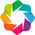

In [13]:
from datashader import transfer_functions as tf
from datashader.colors import Hot
from colorcet import fire
from holoviews.element.tiles import CartoDark
from holoviews.operation.datashader import datashade
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

In [14]:
post_auto_points = hv.Points(post_crime[post_crime.VehicleTheft>0], ['x', 'y'])
post_violent_points = hv.Points(post_crime[post_crime.Violent>0], ['x', 'y'])
post_property_points = hv.Points(post_crime[post_crime.Property>0], ['x', 'y'])
all_violent_points = hv.Points(crime[crime.Violent>0], ['x', 'y'])
all_property_points = hv.Points(crime[crime.Property>0], ['x', 'y'])

In [15]:
x_range, y_range = (-9805000, -9777000), (5315000, 5325000)

**All violent crimes since 2012**

In [19]:
map_tiles  = CartoDark().opts(alpha=1, width=450, height=600, bgcolor='black', xlim=x_range, ylim=y_range)
agg = datashade(all_violent_points, x_sampling=1, y_sampling=1, cmap=Hot)
map_tiles * agg

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [x,y]   (R,G,B,A)

**All property crimes since 2012**

In [20]:
agg = datashade(all_property_points, x_sampling=1, y_sampling=1, cmap=Hot)
map_tiles * agg

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [x,y]   (R,G,B,A)

**Post-covid violent crimes**

In [21]:
agg = datashade(post_violent_points, x_sampling=1, y_sampling=1, cmap=fire)
map_tiles * agg

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [x,y]   (R,G,B,A)

**Post-COVID property crimes**

In [22]:
agg = datashade(post_property_points, x_sampling=1, y_sampling=1, cmap=fire)
map_tiles * agg

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [x,y]   (R,G,B,A)

**Post-COVID auto thefts**

In [23]:
agg = datashade(post_auto_points, x_sampling=1, y_sampling=1, cmap=Hot, width=450, height=500)
map_tiles * agg

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .RGB.I   :RGB   [x,y]   (R,G,B,A)

# Homicide heat maps

In [24]:
import folium
from folium.plugins import MarkerCluster, HeatMap

In [25]:
homicides = crime[(crime.Homicide > 0) &
                  (crime.lat.notnull()) &
                 (crime.ReportedDateTime >= '2020-03-25')].copy(deep=True)

### for apples-to-apples comparison, using same 15 month period starting in 2018
homicides_pre = crime[(crime.Homicide > 0) &
                  (crime.lat.notnull()) &
                 (crime.ReportedDateTime >= '2018-03-25') &
                (crime.ReportedDateTime <= '2019-07-09')].copy(deep=True)

In [26]:
### add cleaner date fields for popups
homicides['date'] = homicides.ReportedDateTime.astype('str').str.slice(0,10)
homicides_pre['date'] = homicides_pre.ReportedDateTime.astype('str').str.slice(0,10)

In [25]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

## Pre-COVID homicides

In [28]:
crime_map_pre = folium.Map(
    location = [43.072, -87.963],
    zoom_start=11.5,
    tiles='Stamen Terrain',
    width=550,
    height=830
)

for _,row in homicides_pre.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=1,
        color='red',
        popup=folium.Popup(f"""<strong>Date:</strong> {row['date']} <br>
                                <strong>Location: </strong> {row['Location']} <br>
                                <strong>Weapon used: </strong> {row['WeaponUsed']}
                    """, max_width=1000),
    ).add_to(crime_map_pre)

murders_pre = homicides_pre[['lat', 'lon']].values

crime_map_pre.add_child(HeatMap(murders_pre, radius=10## Pre-COVID homicides))

### save to file
crime_map_pre.save('pre-covid-homicides.html')
crime_map_pre

## Post-COVID homicides

In [29]:
crime_map = folium.Map(
    location = [43.072, -87.963],
    zoom_start=11.5,
    tiles='Stamen Terrain',
    width=550,
    height=830
)

for _,row in homicides.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=1,
        color='red',
        popup=folium.Popup(f"""<strong>Date:</strong> {row['date']} <br>
                                <strong>Location: </strong> {row['Location']} <br>
                                <strong>Weapon used: </strong> {row['WeaponUsed']}
                    """, max_width=1000),
    ).add_to(crime_map)

murders = homicides[['lat', 'lon']].values

crime_map.add_child(HeatMap(murders, radius=10))
crime_map.save('post-covid-homicides.html')
crime_map

# Comparison of year-over-year census tract trends

In [30]:
plt.style.use('fivethirtyeight')

In [31]:
crime_pre = crime[(crime.ReportedDateTime >= '2019-03-25') &
                   (crime.ReportedDateTime <= '2020-03-25')].copy(deep=True)

crime_post = crime[(crime.ReportedDateTime >= '2020-03-25') &
                   (crime.ReportedDateTime <= '2021-03-25')].copy(deep=True)

### add columns for non-auto property crimes
crime_pre['PropertyOther'] = crime_pre.Property - crime_pre.VehicleTheft
crime_post['PropertyOther'] = crime_post.Property - crime_post.VehicleTheft

In [32]:
tract_pre_totals = crime_pre.groupby('TRACT')\
                [['Violent', 'Homicide', 'PropertyOther', 'VehicleTheft']].sum()
tract_post_totals = crime_post.groupby('TRACT')\
                [['Violent', 'Homicide', 'PropertyOther', 'VehicleTheft']].sum()

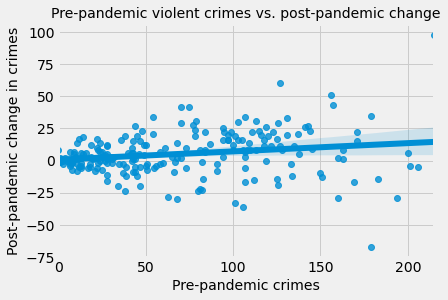

In [33]:
sns.regplot(x=tract_pre_totals['Violent'],
               y=tract_post_totals['Violent'] - tract_pre_totals['Violent'])
plt.title('Pre-pandemic violent crimes vs. post-pandemic change', fontsize=14)
plt.xlabel('Pre-pandemic crimes', fontsize=14)
plt.ylabel('Post-pandemic change in crimes', fontsize=14)
plt.show()

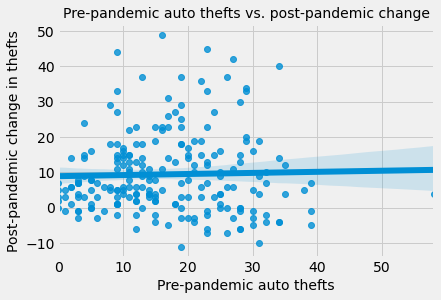

In [34]:
sns.regplot(x=tract_pre_totals['VehicleTheft'],
               y=tract_post_totals['VehicleTheft'] - tract_pre_totals['VehicleTheft'])
plt.title('Pre-pandemic auto thefts vs. post-pandemic change', fontsize=14)
plt.xlabel('Pre-pandemic auto thefts', fontsize=14)
plt.ylabel('Post-pandemic change in thefts', fontsize=14)
plt.show()

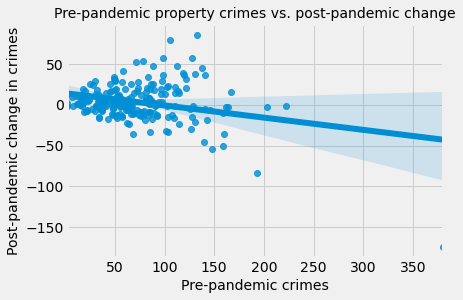

In [35]:
sns.regplot(x=tract_pre_totals['PropertyOther'],
               y=tract_post_totals['PropertyOther'] - tract_pre_totals['PropertyOther'])
plt.title('Pre-pandemic property crimes vs. post-pandemic change', fontsize=14)
plt.xlabel('Pre-pandemic crimes', fontsize=14)
plt.ylabel('Post-pandemic change in crimes', fontsize=14)
plt.show()

The above plot has a clear outlier that will interfere with the fitted line. Let's try again with it removed.

In [37]:
tract_pre_totals[tract_pre_totals.PropertyOther > 350].index

Float64Index([186300.0], dtype='float64', name='TRACT')

In [38]:
tract_pre_property = tract_pre_totals[tract_pre_totals.index != 186300.0].PropertyOther
tract_post_property = tract_post_totals[tract_post_totals.index != 186300.0].PropertyOther

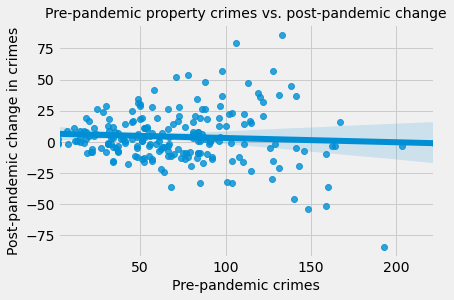

In [39]:
sns.regplot(x=tract_pre_property,
               y=tract_post_property - tract_pre_property)
plt.title('Pre-pandemic property crimes vs. post-pandemic change', fontsize=14)
plt.xlabel('Pre-pandemic crimes', fontsize=14)
plt.ylabel('Post-pandemic change in crimes', fontsize=14)
plt.show()

There's clearly a bit of an association, but not as strong as it appeared before.

In [40]:
tract_pre_totals.sum()

Violent          15077.0
Homicide           100.0
PropertyOther    15656.0
VehicleTheft      3568.0
dtype: float64

In [41]:
tract_post_totals.sum()

Violent          16201.0
Homicide           169.0
PropertyOther    16355.0
VehicleTheft      5594.0
dtype: float64

# Census tract-level maps

## Read in tract file

In [42]:
import geopandas as gpd

In [43]:
wi_shape = 'data/tl_2020_55_tract/tl_2020_55_tract.shp'
wi_tracts = gpd.read_file(wi_shape)

In [44]:
### narrow to only tracts contained in crime
wi_tracts.head(1)

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,55,073,002200,55073002200,22,Census Tract 22,G5020,S,271167646,207509,+44.9326966,-090.2111578,"POLYGON ((-90.31665 44.94203, -90.31663 44.943..."


## Join tract with crime data (which will help filter to only MKE tracts)

In [45]:
wi_tracts[wi_tracts.GEOID.str.contains('55079186100')]

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
25,55,079,186100,55079186100,1861,Census Tract 1861,G5020,S,504578,0,+43.0486524,-087.9427932,"POLYGON ((-87.94777 43.04615, -87.94777 43.047..."


In [46]:
tract_post_totals.head(1)

,Violent,Homicide,PropertyOther,VehicleTheft
TRACT,,,,
0.0,0,0,0.0,2


In [47]:
tract_pre_totals = tract_pre_totals.reset_index()
tract_post_totals = tract_post_totals.reset_index()

tract_pre_totals['GEOID'] = tract_pre_totals.apply(lambda x: '55079'\
                                    + str(int(x['TRACT'])).zfill(6), axis=1)
tract_post_totals['GEOID'] = tract_post_totals.apply(lambda x: '55079'\
                                    + str(int(x['TRACT'])).zfill(6), axis=1)

In [48]:
### Rename columns to be more explicity before merging the two
tract_pre_totals = tract_pre_totals.rename(columns={
                                            'Violent': 'Violent-pre',
                                            'PropertyOther': 'Property-pre',
                                            'Homicide': 'Homicide-pre',
                                            'VehicleTheft': 'Auto theft-pre'
                                            })

tract_post_totals = tract_post_totals.rename(columns={
                                            'Violent': 'Violent-post',
                                            'PropertyOther': 'Property-post',
                                            'Homicide': 'Homicide-post',
                                            'VehicleTheft': 'Auto theft-post'
                                            })

In [49]:
tract_post_totals.head()

,TRACT,Violent-post,Homicide-post,Property-post,Auto theft-post,GEOID
0,0.0,0,0,0.0,2,55079000000
1,101.0,164,0,183.0,41,55079000101
2,102.0,106,1,159.0,44,55079000102
3,201.0,207,0,169.0,63,55079000201
4,202.0,114,0,133.0,31,55079000202


In [50]:
## drop unneeded columns
tract_pre_totals.drop('TRACT', axis=1, inplace=True)
tract_post_totals.drop('TRACT', axis=1, inplace=True)

In [51]:
tract_totals = tract_pre_totals.merge(tract_post_totals, on='GEOID')
tract_totals.head()

,Violent-pre,Homicide-pre,Property-pre,Auto theft-pre,GEOID,Violent-post,Homicide-post,Property-post,Auto theft-post
0,1,0,2.0,3,55079000000,0,0,0.0,2
1,163,0,138.0,28,55079000101,164,0,183.0,41
2,84,0,162.0,19,55079000102,106,1,159.0,44
3,156,0,131.0,26,55079000201,207,0,169.0,63
4,107,0,111.0,18,55079000202,114,0,133.0,31


Calculate changes in crime from pre-post pandemic

In [52]:
tract_totals['Violent change'] = tract_totals['Violent-post'] - tract_totals['Violent-pre']
tract_totals['Homicide change'] = tract_totals['Homicide-post'] - tract_totals['Homicide-pre']
tract_totals['Property change'] = tract_totals['Property-post'] - tract_totals['Property-pre']
tract_totals['Auto theft change'] = tract_totals['Auto theft-post'] - tract_totals['Auto theft-pre']
tract_totals.head()

,Violent-pre,Homicide-pre,Property-pre,Auto theft-pre,GEOID,Violent-post,Homicide-post,Property-post,Auto theft-post,Violent change,Homicide change,Property change,Auto theft change
0,1,0,2.0,3,55079000000,0,0,0.0,2,-1,0,-2.0,-1
1,163,0,138.0,28,55079000101,164,0,183.0,41,1,0,45.0,13
2,84,0,162.0,19,55079000102,106,1,159.0,44,22,1,-3.0,25
3,156,0,131.0,26,55079000201,207,0,169.0,63,51,0,38.0,37
4,107,0,111.0,18,55079000202,114,0,133.0,31,7,0,22.0,13


**Merge shapefile with data**

In [53]:
mke = wi_tracts.merge(tract_totals, on='GEOID', how='inner')

**Merge with population totals and income figures**

In [54]:
pop = pd.read_csv('data/census/tract-population.csv', skiprows=1)
pop.head(1)

,id,Geographic Area Name,Estimate!!Total,Margin of Error!!Total
0,1400000US55079000101,"Census Tract 1.01, Milwaukee County, Wisconsin",4701,531


In [55]:
income = pd.read_csv('data/census/tract-income.csv', skiprows=1)
income.head(1)

,id,Geographic Area Name,Estimate!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households,Margin of Error!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households,Estimate!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!White,Margin of Error!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!White,Estimate!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!Black or African American,Margin of Error!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!Black or African American,Estimate!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!American Indian and Alaska Native,Margin of Error!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!American Indian and Alaska Native,Estimate!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!Asian,Margin of Error!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!Asian,Estimate!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!Native Hawaiian and Other Pacific Islander,Margin of Error!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!Native Hawaiian and Other Pacific Islander,Estimate!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!Some other race,Margin of Error!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!One race--!!Some other race,Estimate!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!Two or more races,Margin of Error!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!Two or more races,Estimate!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!Hispanic or Latino origin (of any race),Margin of Error!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!Hispanic or Latino origin (of any race),"Estimate!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!White alone, not Hispanic or Latino","Margin of Error!!Number!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households!!White alone, not Hispanic or Latino",Estimate!!Number!!HOUSEHOLD INCOME BY AGE OF HOUSEHOLDER!!15 to 24 years,Margin of Error!!Number!!HOUSEHOLD INCOME BY AGE OF HOUSEHOLDER!!15 to 24 years,Estimate!!Number!!HOUSEHOLD INCOME BY AGE OF HOUSEHOLDER!!25 to 44 years,Margin of Error!!Number!!HOUSEHOLD INCOME BY AGE OF HOUSEHOLDER!!25 to 44 years,Estimate!!Number!!HOUSEHOLD INCOME BY AGE OF HOUSEHOLDER!!45 to 64 years,Margin of Error!!Number!!HOUSEHOLD INCOME BY AGE OF HOUSEHOLDER!!45 to 64 years,Estimate!!Number!!HOUSEHOLD INCOME BY AGE OF HOUSEHOLDER!!65 years and over,Margin of Error!!Number!!HOUSEHOLD INCOME BY AGE OF HOUSEHOLDER!!65 years and over,Estimate!!Number!!FAMILIES!!Families,Margin of Error!!Number!!FAMILIES!!Families,Estimate!!Number!!FAMILIES!!Families!!With own children of householder under 18 years,Margin of Error!!Number!!FAMILIES!!Families!!With own children of householder under 18 years,Estimate!!Number!!FAMILIES!!Families!!With no own children of householder under 18 years,Margin of Error!!Number!!FAMILIES!!Families!!With no own children of householder under 18 years,Estimate!!Number!!FAMILIES!!Families!!Married-couple families,Margin of Error!!Number!!FAMILIES!!Families!!Married-couple families,Estimate!!Number!!FAMILIES!!Families!!Married-couple families!!With own children under 18 years

In [56]:
### create a GEOID column and narrow to only GEOID and population
pop['GEOID'] = pop.id.str.slice(-11,)
pop = pop.rename(columns={'Estimate!!Total': 'population'})

pop = pop[['GEOID', 'population']]

pop.head(1)

,GEOID,population
0,55079000101,4701


In [57]:
income['GEOID'] = income.id.str.slice(-11,)
income = income.rename(columns={'Estimate!!Median income (dollars)!!HOUSEHOLD INCOME BY RACE AND HISPANIC OR LATINO ORIGIN OF HOUSEHOLDER!!Households': 'income'})

income = income[['GEOID', 'income']]

In [58]:
mke = mke.merge(pop, on='GEOID', how='inner')\
        .merge(income, on='GEOID', how='inner')

**Create per-100k rates for crimes for pre- and post-COVID**

In [59]:
for crm in ['Violent', 'Property', 'Auto theft', 'Homicide']:
    for time in ['-pre', '-post']:
        mke[crm + time + '-rate'] = (mke[crm + time] /\
                                        mke.population * 100000).round(1)        

## Choropleth maps

In [61]:
import contextily as ctx
# set appropriate projection
mke = mke.to_crs(epsg=3857)

In [72]:
### Looks like there's a tract with no people that needs to be removed
mke.sort_values(by='population').population[:5]

19        0
93      903
159     905
140     907
138    1053
Name: population, dtype: int64

In [62]:
mke = mke[mke.population >0]

**Violent crime rate**

Make some histograms to get a sense of the distribution of crime across tracts, and also to get a sense of what appropriate bin ranges could be for the various colormaps.

In [64]:
## defining to use below to color pos/neg bars
heights, bins, _ = plt.hist(mke['Violent change'], bins=20)
bin_width = np.diff(bins)[0]
bin_pos = bins[:-1] + bin_width / 2
plt.close()

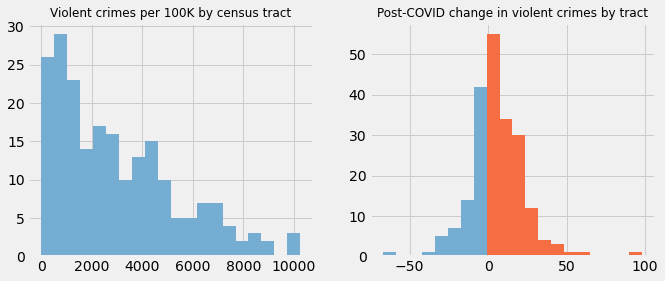

In [65]:
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.hist(mke['Violent-post-rate'], bins=20, color='#74add1')
plt.title('Violent crimes per 100K by census tract', size=12)

plt.subplot(1,2,2)
mask = (bin_pos >= 0)
plt.bar(bin_pos[mask], heights[mask], width=bin_width, color='#f46d43')
plt.bar(bin_pos[~mask], heights[~mask], width=bin_width, color='#74add1')
plt.title('Post-COVID change in violent crimes by tract', size=12)
plt.show()

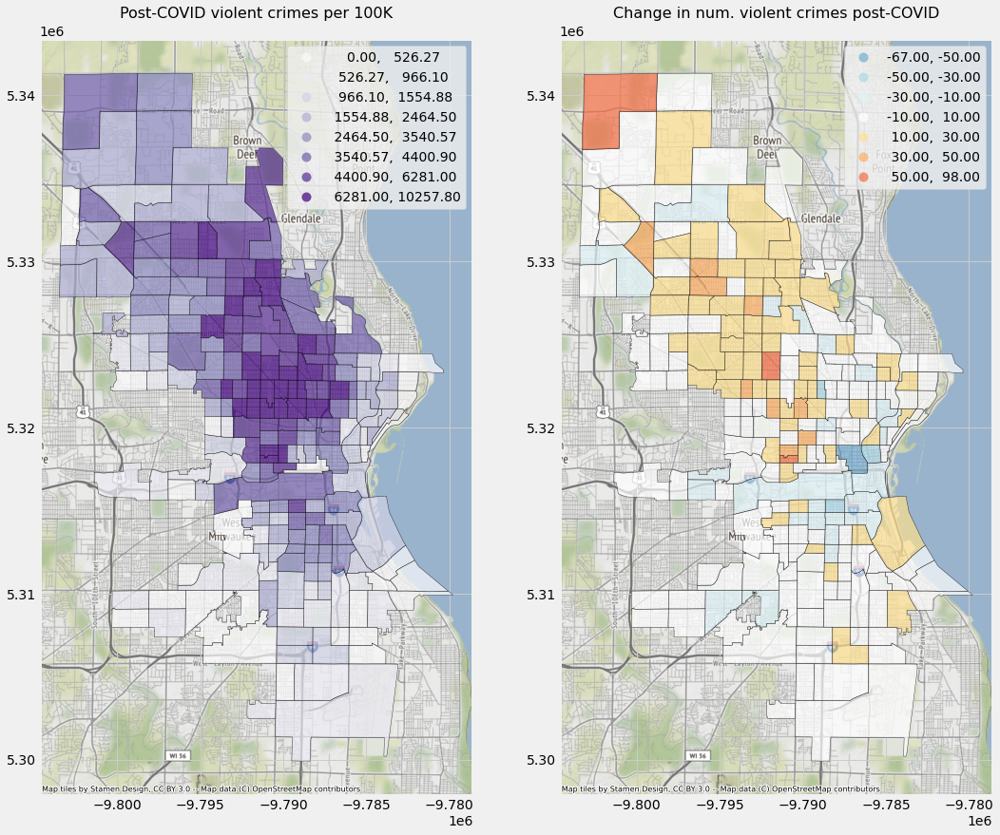

In [66]:
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

violent_bins = np.quantile(mke['Violent-post-rate'], [.125, .25, .375, .5, .625, .75, .875])

colors = ['#f46d43','#fdae61','#fee090','#ffffff',#'#ffffbf',
                       '#e0f3f8','#abd9e9','#74add1']

cmap = ListedColormap(colors[::-1])
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 15))

mke.plot(ax=ax1, alpha=0.7, edgecolor='k', lw=0.5, scheme='User_Defined',
             column='Violent-post-rate', legend=True, cmap='Purples',
            classification_kwds=dict(bins=violent_bins))
ax1.set_title('Post-COVID violent crimes per 100K', size=16, y=1.02)
ctx.add_basemap(ax1, zoom=12)

mke.plot(ax=ax2, alpha=0.7, edgecolor='k', lw=0.5, cmap=cmap,
         scheme="User_Defined", column='Violent change', legend=True,
        classification_kwds=dict(bins=[-50, -30, -10, 10, 30, 50]))
ax2.set_title('Change in num. violent crimes post-COVID', size=16, y=1.02)

ctx.add_basemap(ax2, zoom=12)

**Non-auto theft property crime rate**

In [67]:
## defining to use below to color pos/neg bars
heights, bins, _ = plt.hist(mke['Property change'], bins=20)
bin_width = np.diff(bins)[0]
bin_pos = bins[:-1] + bin_width / 2
plt.close()

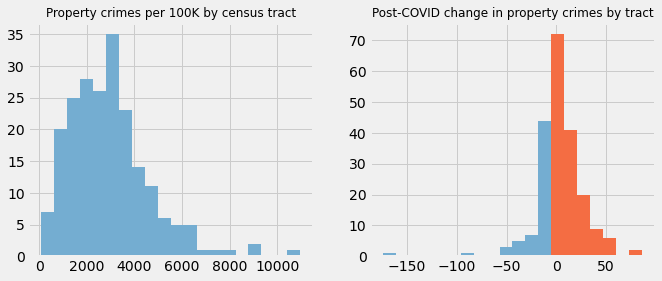

In [68]:
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.hist(mke['Property-post-rate'], bins=20, color='#74add1')
plt.title('Property crimes per 100K by census tract', size=12)

plt.subplot(1,2,2)
mask = (bin_pos >= 0)
plt.bar(bin_pos[mask], heights[mask], width=bin_width, color='#f46d43')
plt.bar(bin_pos[~mask], heights[~mask], width=bin_width, color='#74add1')
plt.title('Post-COVID change in property crimes by tract', size=12)
plt.show()

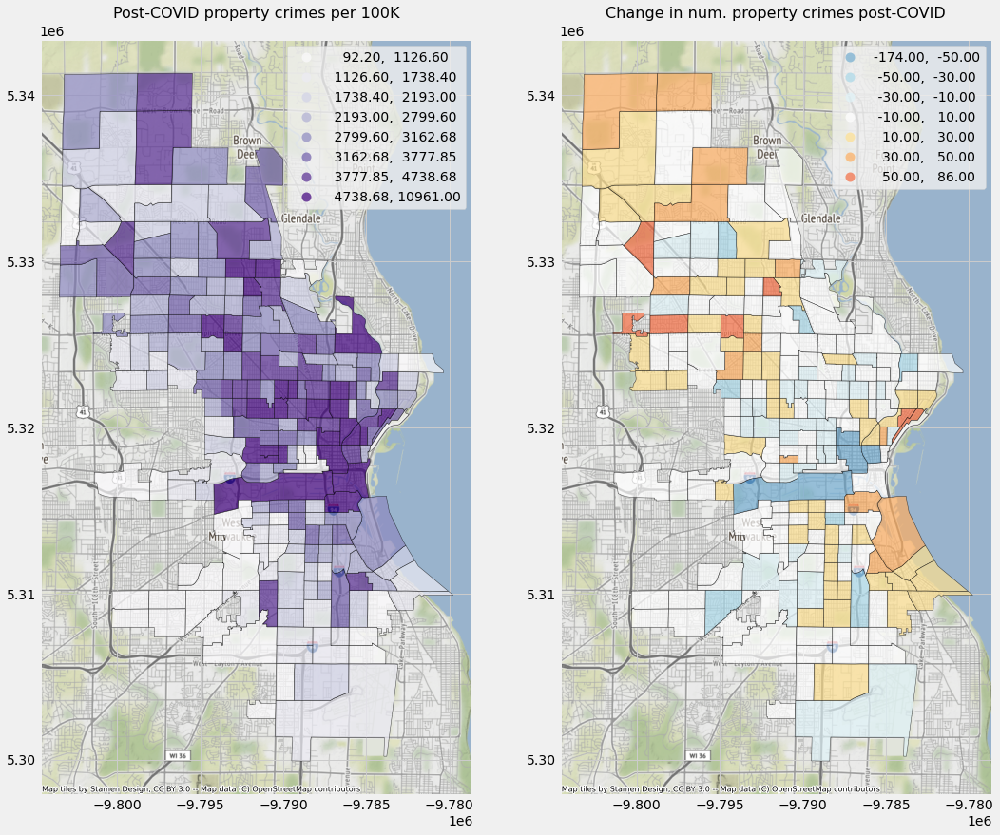

In [69]:
property_bins = np.quantile(mke['Property-post-rate'], [.125, .25, .375, .5, .625, .75, .875])

cmap = ListedColormap(['#f46d43','#fdae61','#fee090','#ffffff',
                       '#e0f3f8','#abd9e9','#74add1'][::-1])
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 15))

mke.plot(ax=ax1, alpha=0.7, edgecolor='k', lw=0.5, scheme='User_Defined',
             column='Property-post-rate', legend=True,cmap='Purples',
            classification_kwds=dict(bins=property_bins))
ax1.set_title('Post-COVID property crimes per 100K', size=16, y=1.02)
ctx.add_basemap(ax1, zoom=12)


mke.plot(ax=ax2, alpha=0.7, edgecolor='k', lw=0.5, cmap=cmap,
         scheme="User_Defined", column='Property change', legend=True,
        classification_kwds=dict(bins=[-50, -30, -10, 10, 30, 50]))
ax2.set_title('Change in num. property crimes post-COVID', size=16, y=1.02)

ctx.add_basemap(ax2, zoom=12)

**Auto-thefts**

In [70]:
## defining to use below to color pos/neg bars
heights, bins, _ = plt.hist(mke['Auto theft change'], bins=20)
bin_width = np.diff(bins)[0]
bin_pos = bins[:-1] + bin_width / 2
plt.close()

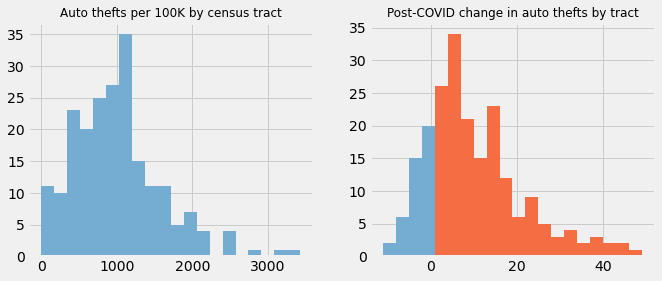

In [71]:
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.hist(mke['Auto theft-post-rate'], bins=20, color='#74add1')
plt.title('Auto thefts per 100K by census tract', size=12)

plt.subplot(1,2,2)
mask = (bin_pos >= 0)
plt.bar(bin_pos[mask], heights[mask], width=bin_width, color='#f46d43')
plt.bar(bin_pos[~mask], heights[~mask], width=bin_width, color='#74add1')
plt.title('Post-COVID change in auto thefts by tract', size=12)
plt.show()

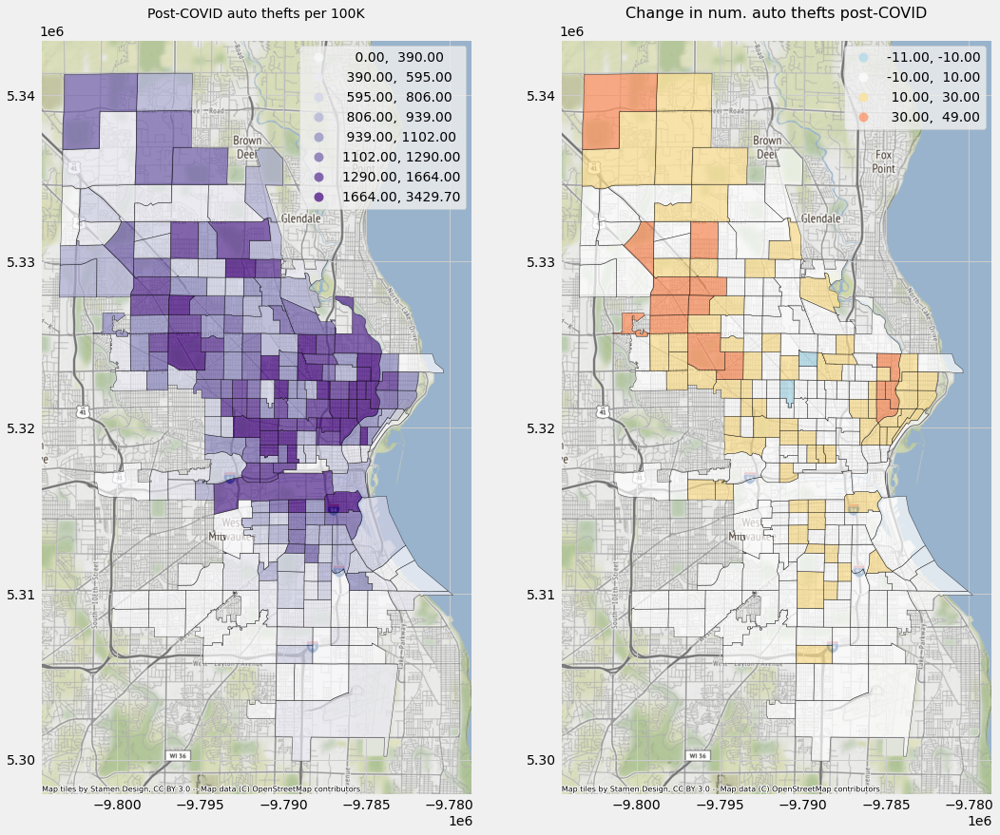

In [72]:
auto_bins = np.round(np.quantile(mke['Auto theft-post-rate'],
                    [.125, .25, .375, .5, .625, .75, .875])).astype(int)

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 15))

cmap = ListedColormap(['#abd9e9', '#ffffff', '#fee090', '#fc8d59'])

mke.plot(ax=ax1, alpha=0.7, edgecolor='k', lw=0.5, scheme='User_Defined',
             column='Auto theft-post-rate', legend=True, cmap='Purples',
            classification_kwds=dict(bins=auto_bins))
ax1.set_title('Post-COVID auto thefts per 100K', size=14, y=1.02)
ctx.add_basemap(ax1, zoom=12)

mke.plot(ax=ax2, alpha=0.7, edgecolor='k', lw=0.5, cmap=cmap,
         scheme="User_Defined", column='Auto theft change', legend=True,
        classification_kwds=dict(bins=[-10, 10, 30]))
ax2.set_title('Change in num. auto thefts post-COVID', size=16, y=1.02)

ctx.add_basemap(ax2, zoom=12)

# Auto theft hexbin plots

In [73]:
autos_post = crime[(crime.VehicleTheft > 0) &
                  (crime.lat.notnull()) &
                 (crime.ReportedDateTime >= '2020-03-25')].copy(deep=True)

autos_pre = crime[(crime.VehicleTheft > 0) &
                  (crime.lat.notnull()) &
                 (crime.ReportedDateTime >= '2018-03-25') &
                (crime.ReportedDateTime <= '2019-07-09')].copy(deep=True)

In [75]:
import matplotlib.lines as mlines
colors = ['#ffffb2','#fed976','#feb24c','#fd8d3c','#fc4e2a', '#e31a1c','#b10026']
labels = ['>=1', '>5', '>10', '>15', '>20', '>25', '>30']

handles = []
for c, l in zip(colors, labels):
    handles.append(mlines.Line2D([], [], color=c, ls='-', label=l))

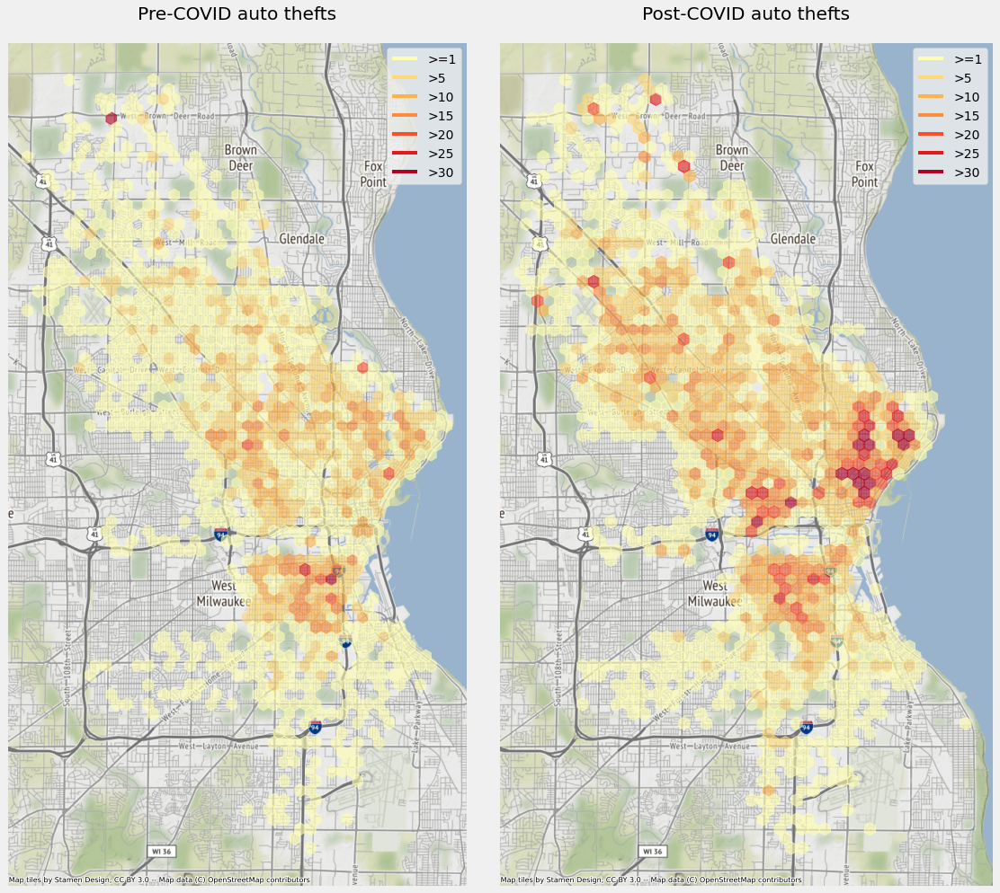

In [76]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16, 14))

cmap = ListedColormap(colors)

autos_pre.plot(ax=ax1, kind='hexbin', bins=[5, 10, 15, 20, 25, 30],
               x='x', y='y', alpha=0.6,
               mincnt=1, cmap=cmap, colorbar=False, gridsize=(40,40))
ax1.set_title('Pre-COVID auto thefts', y=1.02)
ax1.get_xaxis().set_visible(False); ax1.get_yaxis().set_visible(False)
ax1.legend(handles=handles)

ctx.add_basemap(ax1, zoom=12)

autos_post.plot(ax=ax2, kind='hexbin', bins=[5, 10, 15, 20, 25, 30],
                x='x', y='y', alpha=0.6,
                mincnt=1, cmap=cmap, colorbar=False, gridsize=(40, 40))
ax2.set_title('Post-COVID auto thefts', y=1.02)
ax2.get_xaxis().set_visible(False); ax2.get_yaxis().set_visible(False)
ax2.legend(handles=handles)

ctx.add_basemap(ax2, zoom=12)
plt.tight_layout()
plt.show()

# Compare crime rates against incomes

In [77]:
mke.income = mke.income.str.replace('-', '0').astype(float)

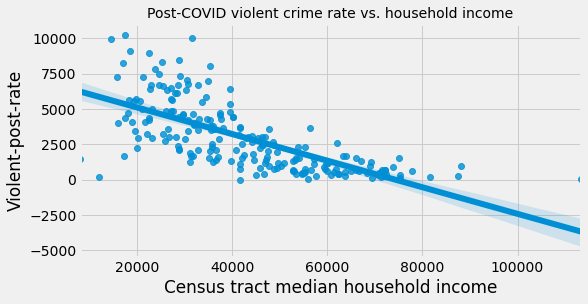

In [78]:
plt.figure(figsize=(8,4))
sns.regplot(data=mke[mke.income>0], x='income', y='Violent-post-rate')
plt.title('Post-COVID violent crime rate vs. household income', fontsize=14)
plt.xlabel('Census tract median household income')
plt.show()

There is a very strong and unsuprising association between violent crime and income (above). But did the areas that saw shifts in post-COVID violent crime tend to have higher or lower income levels (below)? Not much of a relationship here.

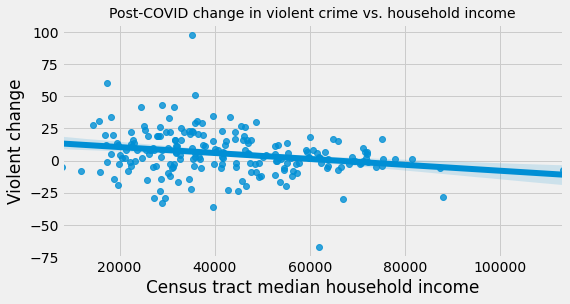

In [81]:
plt.figure(figsize=(8,4))
sns.regplot(data=mke[mke.income>0], x='income', y='Violent change')
plt.title('Post-COVID change in violent crime vs. household income', fontsize=14)
plt.xlabel('Census tract median household income')
plt.show()

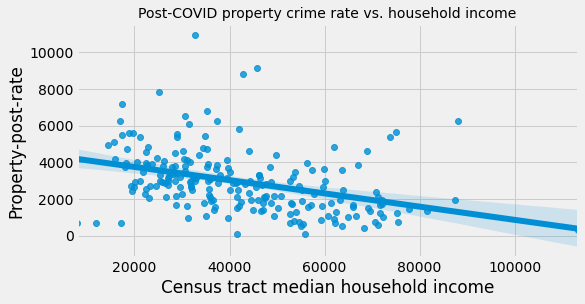

In [82]:
plt.figure(figsize=(8,4))
sns.regplot(data=mke[mke.income>0], x='income', y='Property-post-rate')
plt.title('Post-COVID property crime rate vs. household income', fontsize=14)
plt.xlabel('Census tract median household income')
plt.show()

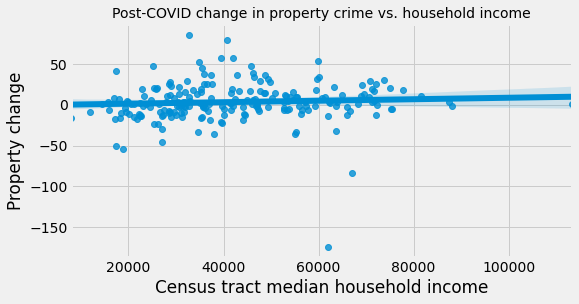

In [83]:
plt.figure(figsize=(8,4))
sns.regplot(data=mke[mke.income>0], x='income', y='Property change')
plt.title('Post-COVID change in property crime vs. household income', fontsize=14)
plt.xlabel('Census tract median household income')
plt.show()

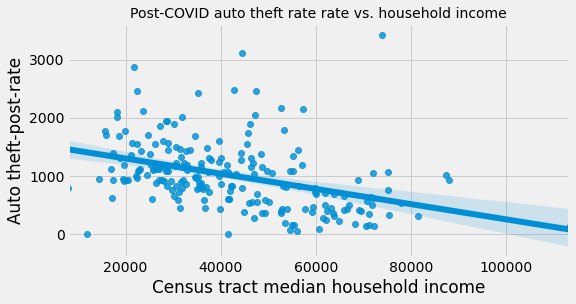

In [84]:
plt.figure(figsize=(8,4))
sns.regplot(data=mke[mke.income>0], x='income', y='Auto theft-post-rate')
plt.title('Post-COVID auto theft rate rate vs. household income', fontsize=14)
plt.xlabel('Census tract median household income')
plt.show()

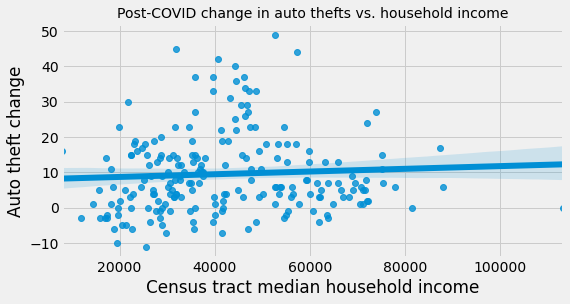

In [85]:
plt.figure(figsize=(8,4))
sns.regplot(data=mke[mke.income>0], x='income', y='Auto theft change')
plt.title('Post-COVID change in auto thefts vs. household income', fontsize=14)
plt.xlabel('Census tract median household income')
plt.show()